### Imports

In [1]:
# Standard Library Imports
import os
import math
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import cv2

# TensorFlow / Keras Imports
import tensorflow as tf
from tensorflow.keras import layers, models, Input, backend as K
from tensorflow.keras.applications import Xception, MobileNetV2
from tensorflow.keras.layers import (
    Conv2D, Conv2DTranspose, BatchNormalization, LeakyReLU, UpSampling2D,
    concatenate, Dropout, ZeroPadding2D
)
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping, ReduceLROnPlateau
from tensorflow.keras.metrics import MeanIoU
from tensorflow.keras.utils import Sequence
from tensorflow.keras.regularizers import l2
from tensorflow.keras.initializers import he_normal

# Additional Libraries
import albumentations as A
from IPython.display import clear_output



2025-02-28 11:30:59.779798: I tensorflow/core/util/port.cc:153] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2025-02-28 11:30:59.830194: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1740731459.876904  248296 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1740731459.890074  248296 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2025-02-28 11:30:59.943910: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instr

In [2]:
# GPU MEMORY GROWTH
gpus = tf.config.experimental.list_physical_devices('GPU')
if gpus:
    try:
        for gpu in gpus:
            tf.config.experimental.set_memory_growth(gpu, True)
        print("Memory growth set for GPUs.")
    except RuntimeError as e:
        print(f"Error setting memory growth: {e}")
# ENCODE AND DECODE METHOD  

Memory growth set for GPUs.


In [3]:
mask_rgb_values = {
    'Forest': [0, 255, 0],
    'Agricultural Land': [165, 42, 42],
    'Road': [70, 130, 180],
    'Grassland': [50, 205, 50],
    'Water Bodies': [0, 0, 255],
    'Shrubland': [173, 255, 47],
    'Built-up': [255, 105, 45],
    'Unlabelled': [0, 0, 0],
}

def encode_categorical(mask, num_classes=8):
    cat_encoded = np.zeros((mask.shape[0], mask.shape[1], num_classes), dtype='float32')
    for i, value in enumerate(mask_rgb_values.values()):
        condition = np.all(mask == value, axis=-1)
        cat_encoded[condition, i] = 1.0
    return cat_encoded


def decode_prediction(pred, num_classes=8):
  argmax_idx = np.array([np.argmax(x) for x in pred.reshape((-1, num_classes))])
  argmax_idx = argmax_idx.reshape(pred.shape[:-1])

  decoded_mask=np.zeros(shape=(*pred.shape[:-1], 3), dtype='uint8')

  for i, value in enumerate(mask_rgb_values.values()):
    decoded_mask[argmax_idx==i] = value
  return decoded_mask  

In [4]:
  
# CUSTOM DATA GENERATOR  
  
class ImageDataGenerator(Sequence):
    def __init__(self,
                 img_paths,
                 mask_paths,
                 batch_size,
                 augment,
                 num_classes=8,
                 shuffle=False):
        self.img_paths = img_paths
        self.mask_paths = mask_paths
        self.shuffle = shuffle
        self.num_classes = num_classes
        self.batch_size = batch_size
        self.augment = augment

        self.indexes = np.arange(len(self.img_paths))
        self.on_epoch_end()
        
    def __len__(self):
        return math.ceil(len(self.img_paths) / self.batch_size)

    def on_epoch_end(self):
        if self.shuffle:
            np.random.shuffle(self.indexes)

    def __getitem__(self, index):
        # Get batch indexes
        batch_indexes = self.indexes[index * self.batch_size:(index + 1) * self.batch_size]
        batch_img_paths = [self.img_paths[i] for i in batch_indexes]
        batch_mask_paths = [self.mask_paths[i] for i in batch_indexes]

        # Load and preprocess batch
        X, y = self.__load_batch(batch_img_paths, batch_mask_paths)
        return X, y
    
    def __load_batch(self, batch_img_paths, batch_mask_paths):
        batch_img = []
        batch_mask = []

        for img_path, mask_path in zip(batch_img_paths, batch_mask_paths):
            # Load image and mask
            image = cv2.cvtColor(cv2.imread(img_path), cv2.COLOR_BGR2RGB)
            mask = cv2.cvtColor(cv2.imread(mask_path), cv2.COLOR_BGR2RGB)

            # Encode mask as categorical
            mask = encode_categorical(mask, num_classes=self.num_classes)
            
            # Perform augmentation if enabled
            if self.augment:
                augmented_images, augmented_masks = self.data_augmentation(image, mask)
                batch_img.extend(augmented_images)
                batch_mask.extend(augmented_masks)
            else:
                batch_img.append(image.astype(np.float32) / 255.0)
                batch_mask.append(mask.astype(np.float32))

        return np.array(batch_img, dtype='float32'), np.array(batch_mask, dtype='float32')   

    def data_augmentation(self, image, mask):
        transform = A.Compose([
            A.RandomBrightnessContrast(p=0.2),
            A.HorizontalFlip(p=0.5),
            A.VerticalFlip(p=0.5),
        ])

        augmented = transform(image=image, mask=mask)
        augmented_image = augmented['image']
        augmented_mask = augmented['mask']

        original_image = image.astype(np.float32) / 255.0
        original_mask = mask.astype(np.float32) 
        augmented_image = augmented_image.astype(np.float32) / 255.0
        augmented_mask = augmented_mask.astype(np.float32)

        return [original_image, augmented_image], [original_mask, augmented_mask]    

In [5]:

# Load CSVs
train_df = pd.read_csv('/home/rdadmin/Tsiyon/notebook/SPLITS/train.csv')
val_df = pd.read_csv('/home/rdadmin/Tsiyon/notebook/SPLITS/val.csv')
test_df = pd.read_csv('/home/rdadmin/Tsiyon/notebook/SPLITS/test.csv')

# Extract paths from the CSVs
train_img_paths = train_df['image_path'].tolist()
train_mask_paths = train_df['mask_path'].tolist()

val_img_paths = val_df['image_path'].tolist()
val_mask_paths = val_df['mask_path'].tolist()

test_img_paths = test_df['image_path'].tolist()
test_mask_paths = test_df['mask_path'].tolist()

In [6]:
# METRICS
def dice_loss(y_true, y_pred, smooth=1):
    y_true_f = tf.keras.backend.flatten(y_true)
    y_pred_f = tf.keras.backend.flatten(y_pred)
    intersection = tf.keras.backend.sum(y_true_f * y_pred_f)
    return 1 - (2. * intersection + smooth) / (tf.keras.backend.sum(y_true_f) + tf.keras.backend.sum(y_pred_f) + smooth)

def combined_dice_crossentropy_loss(y_true, y_pred):
    dice = dice_loss(y_true, y_pred)
    crossentropy = tf.keras.losses.categorical_crossentropy(y_true, y_pred)
    return dice + crossentropy


class MeanIoUWrapper(tf.keras.metrics.Metric):
    def __init__(self, num_classes, name='iou_metric', **kwargs):
        super(MeanIoUWrapper, self).__init__(name=name, **kwargs)
        self.num_classes = num_classes
        self.iou_metric = MeanIoU(num_classes=num_classes)

    def update_state(self, y_true, y_pred, sample_weight=None):
        y_true = tf.argmax(y_true, axis=-1)
        y_pred = tf.argmax(y_pred, axis=-1)
        self.iou_metric.update_state(y_true, y_pred, sample_weight)

    def result(self):
        return self.iou_metric.result()

    def reset_states(self):
        self.iou_metric.reset_states()

def iou_metric(y_true, y_pred):
    y_pred = tf.argmax(y_pred, axis=-1)
    y_true = tf.cast(tf.argmax(y_true, axis=-1), tf.float32)
    y_pred = tf.cast(y_pred, tf.float32)
    intersection = tf.reduce_sum(y_true * y_pred)
    union = tf.reduce_sum(y_true) + tf.reduce_sum(y_pred) - intersection
    return intersection / (union + 1e-6)  
    
def dice_coef_metric(y_true, y_pred, smooth=1):
    y_true_f = tf.keras.backend.flatten(y_true)
    y_pred_f = tf.keras.backend.flatten(y_pred)
    intersection = tf.keras.backend.sum(y_true_f * y_pred_f)
    return (2. * intersection + smooth) / (tf.keras.backend.sum(y_true_f) + tf.keras.backend.sum(y_pred_f) + smooth)
    
def jacard_coef(y_true, y_pred):
    y_true_f = tf.keras.backend.flatten(y_true)
    y_pred_f = tf.keras.backend.flatten(y_pred)
    intersection = tf.keras.backend.sum(y_true_f * y_pred_f)
    return (intersection + 1.0) / (tf.keras.backend.sum(y_true_f) + tf.keras.backend.sum(y_pred_f) - intersection + 1.0)
input_shape = (256, 256, 3)
n_classes = 8

In [8]:


def decoder_block(x, y, filters, dropout_rate=0.3):
    x = layers.Conv2DTranspose(filters, (2, 2), strides=(2, 2), padding='same')(x)
    
    # Adjust the number of filters in y to match x
    y = layers.Conv2D(filters, (1, 1), padding='same')(y)
    
    # Apply ZeroPadding to the feature map y to match the shape of x
    if x.shape[1] != y.shape[1] or x.shape[2] != y.shape[2]:
        y = layers.ZeroPadding2D(((0, x.shape[1] - y.shape[1]), (0, x.shape[2] - y.shape[2])))(y)
    
    x = layers.Add()([x, y])
    x = layers.Conv2D(filters, 3, padding='same', kernel_regularizer=tf.keras.regularizers.l2(0.01))(x)
    x = layers.BatchNormalization()(x)
    x = layers.LeakyReLU()(x)
    x = Dropout(dropout_rate)(x)
    x = layers.Conv2D(filters, 3, padding='same', kernel_regularizer=tf.keras.regularizers.l2(0.01))(x)
    x = layers.BatchNormalization()(x)
    x = layers.LeakyReLU()(x)
    x = Dropout(dropout_rate)(x)
    return x

def mobilenetv2_linknet(input_shape, classes, dropout):
    inputs = Input(input_shape)
    mobilenetv2 = MobileNetV2(include_top=False, weights="imagenet", input_tensor=inputs)

    # Extract specific layers for skip connections
    s1 = mobilenetv2.get_layer("block_1_expand_relu").output  # 128x128x32
    s2 = mobilenetv2.get_layer("block_3_expand_relu").output  # 64x64x64
    s3 = mobilenetv2.get_layer("block_6_expand_relu").output  # 32x32x96
    s4 = mobilenetv2.get_layer("block_13_expand_relu").output  # 16x16x160
    x = mobilenetv2.get_layer("out_relu").output  # 8x8x1280

    # Decoder
    x = decoder_block(x, s4, 1024)
    x = decoder_block(x, s3, 512)
    x = decoder_block(x, s2, 256)
    x = decoder_block(x, s1, 128)
    x = layers.UpSampling2D(size=(2, 2))(x)
    x = layers.Dropout(dropout)(x)
    outputs = layers.Conv2D(classes, 1, activation="softmax")(x)

    model = Model(inputs, outputs, name="MobileNetV2_LinkNet")
    return model 

In [9]:
#MODEL TRAINING
train_generator = ImageDataGenerator(
    img_paths=train_img_paths,
    mask_paths=train_mask_paths,
    batch_size=16,
    augment=True,  # Enable augmentation for training
    num_classes=8,
    shuffle=True  # Shuffle training data
)

val_generator = ImageDataGenerator(
    img_paths=val_img_paths,
    mask_paths=val_mask_paths,
    batch_size=16,
    augment=False,  # Disable augmentation for validation
    num_classes=8,
    shuffle=False  # No shuffling for validation
)

test_generator = ImageDataGenerator(
    img_paths=test_img_paths,
    mask_paths=test_mask_paths,
    batch_size=8,
    augment=False,  # No augmentation for testing
    num_classes=8,
    shuffle=False  # No shuffling for testing
)


In [10]:
from tensorflow.keras.mixed_precision import Policy, set_global_policy
clear_output()

In [11]:
from tensorflow.keras.models import Model
# Set mixed precision policy
policy = Policy('mixed_float16')
set_global_policy(policy)
saved_model_path = "/home/rdadmin/Tsiyon/NEWONE/MODELSAVED/LINKMOBV2_best.weights.h5"
strategy = tf.distribute.MirroredStrategy()
with strategy.scope():
    model = mobilenetv2_linknet(input_shape, classes=n_classes, dropout=0.3)
    adamw_optimizer = Adam(learning_rate=1e-4)
    model.load_weights(saved_model_path)
    model.compile(optimizer=adamw_optimizer, 
              loss=combined_dice_crossentropy_loss, 
              metrics=[dice_coef_metric, jacard_coef, MeanIoUWrapper(num_classes=n_classes)])

INFO:tensorflow:Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1')


I0000 00:00:1740731620.079389  248296 gpu_device.cc:2022] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 12624 MB memory:  -> device: 0, name: Tesla T4, pci bus id: 0000:06:00.0, compute capability: 7.5
I0000 00:00:1740731620.082742  248296 gpu_device.cc:2022] Created device /job:localhost/replica:0/task:0/device:GPU:1 with 13136 MB memory:  -> device: 1, name: Tesla T4, pci bus id: 0000:07:00.0, compute capability: 7.5
/tmp/ipykernel_248296/3122810121.py:24: UserWarning: `input_shape` is undefined or non-square, or `rows` is not in [96, 128, 160, 192, 224]. Weights for input shape (224, 224) will be loaded as the default.
  mobilenetv2 = MobileNetV2(include_top=False, weights="imagenet", input_tensor=inputs)


## VALIDATION

2025-02-24 09:45:11.670377: I tensorflow/core/framework/local_rendezvous.cc:405] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node MultiDeviceIteratorGetNextFromShard}}]]
2025-02-24 09:45:11.670566: I tensorflow/core/framework/local_rendezvous.cc:405] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node MultiDeviceIteratorGetNextFromShard}}]]
	 [[RemoteCall]]
2025-02-24 09:45:11.680286: I tensorflow/core/framework/local_rendezvous.cc:405] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node MultiDeviceIteratorGetNextFromShard}}]]
	 [[RemoteCall]]
2025-02-24 09:45:21.206140: E tensorflow/core/util/util.cc:131] oneDNN supports DT_HALF only on platforms with AVX-512. Falling back to the default Eigen-based implementation if present.
I0000 00:00:1740379521.810866 3044948 cuda_dnn.cc:529] Loaded cuDNN version 90300
I0000 00:00:1740379521.872145 3044945 cuda_dnn.cc:529] Loaded cuDNN version 90300


1/1 ━━━━━━━━━━━━━━━━━━━━ 14s 14s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 507ms/step


2025-02-24 09:45:26.660609: I tensorflow/core/framework/local_rendezvous.cc:405] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node MultiDeviceIteratorGetNextFromShard}}]]
	 [[RemoteCall]]


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 475ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 445ms/step


2025-02-24 09:45:29.963058: I tensorflow/core/framework/local_rendezvous.cc:405] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node MultiDeviceIteratorGetNextFromShard}}]]
	 [[RemoteCall]]


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 465ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 441ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 463ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 454ms/step


2025-02-24 09:45:36.292008: I tensorflow/core/framework/local_rendezvous.cc:405] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node MultiDeviceIteratorGetNextFromShard}}]]
	 [[RemoteCall]]


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 428ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 454ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 454ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 457ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 431ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 473ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 437ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 449ms/step


2025-02-24 09:45:49.010701: I tensorflow/core/framework/local_rendezvous.cc:405] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node MultiDeviceIteratorGetNextFromShard}}]]
	 [[RemoteCall]]


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 556ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 445ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 466ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 469ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 431ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 445ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 432ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 456ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 465ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 461ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 467ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 434ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 465ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 432ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 484ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 432ms/step


2025-02-24 09:46:14.634014: I tensorflow/core/framework/local_rendezvous.cc:405] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node MultiDeviceIteratorGetNextFromShard}}]]
	 [[RemoteCall]]


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 458ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 486ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 462ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 495ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 451ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 500ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 463ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 492ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 468ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 470ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 487ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 442ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 462ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 443ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 449ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 460ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 433ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 457ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 439ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 434ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 451ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 431ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 457ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 448ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 471ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 

2025-02-24 09:47:06.896925: I tensorflow/core/framework/local_rendezvous.cc:405] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node MultiDeviceIteratorGetNextFromShard}}]]
	 [[RemoteCall]]


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 465ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 432ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 462ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 459ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 431ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 446ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 464ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 458ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 462ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 519ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 460ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 459ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 480ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 426ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 487ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 448ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 430ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 440ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 470ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 453ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 431ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 490ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 463ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 460ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 493ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 

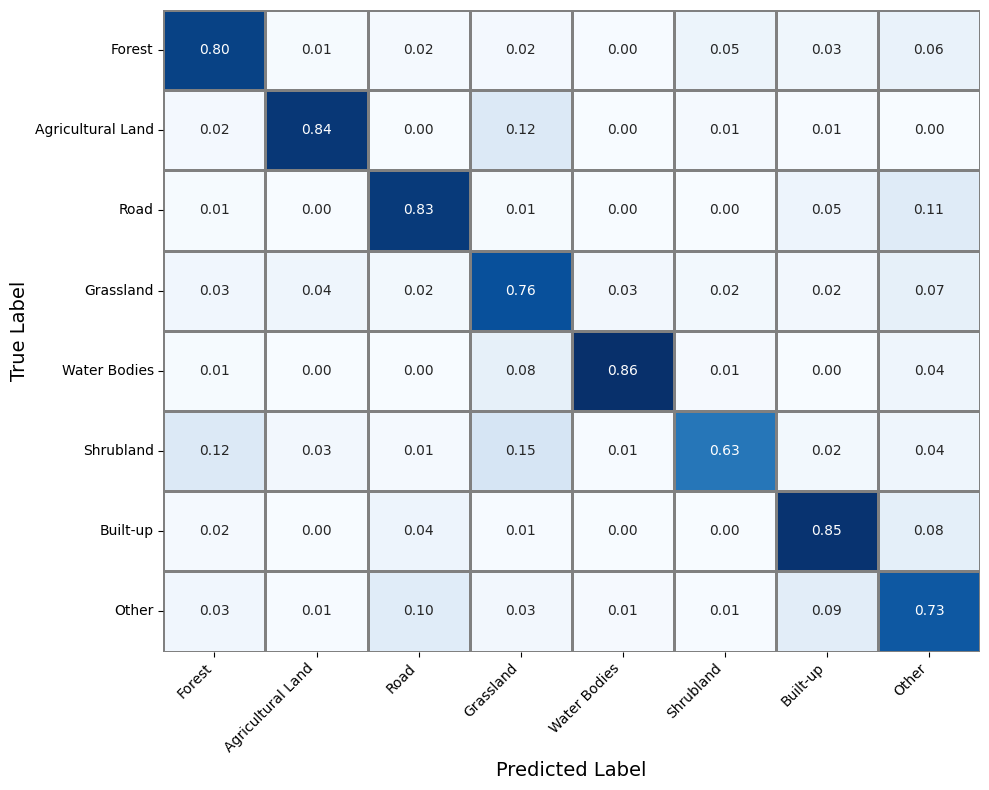

In [11]:
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix

total_steps = len(val_generator)  
# Initialize arrays to store predictions and true labels
all_preds = []
all_true = []

# Loop through the test generator to collect predictions and ground truths
for i in range(total_steps):
    # Get the next batch of images and masks from the generator
    batch = val_generator[i]
    imgs, masks = batch[0], batch[1]  # Assuming the generator returns (images, masks)

    preds = model.predict(imgs)  # Predict on the batch
    preds = preds.argmax(axis=-1)  # Convert probabilities to class indices
    masks = masks.argmax(axis=-1)  # Convert one-hot masks to class indices

    all_preds.append(preds)
    all_true.append(masks)

# Convert the lists to numpy arrays and flatten them
y_true_flat = np.concatenate(all_true, axis=None)  # Concatenate and flatten true labels
y_pred_flat = np.concatenate(all_preds, axis=None)  # Concatenate and flatten predictions

# Class labels for the confusion matrix
class_labels = ['Forest', 'Agricultural Land', 'Road', 'Grassland',
                'Water Bodies', 'Shrubland', 'Built-up', 'Other']

# Confusion Matrix
conf_matrix = confusion_matrix(y_true_flat, y_pred_flat)
conf_matrix_normalized = conf_matrix.astype('float') / conf_matrix.sum(axis=1)[:, np.newaxis]
conf_matrix_normalized = np.nan_to_num(conf_matrix_normalized)  # Handle NaN values

# Plotting the confusion matrix
plt.figure(figsize=(10, 8))
ax = sns.heatmap(conf_matrix_normalized, annot=True, cmap='Blues',
                 xticklabels=class_labels, yticklabels=class_labels, fmt='.2f', cbar=False,  # Set cbar=False to remove the color bar
                 linewidths=0.722819, linecolor='gray')

# Increase font size of text labels
plt.xlabel('Predicted Label', fontsize=14)
plt.ylabel('True Label', fontsize=14)

# Make all four borders bold and equal
for spine in ax.spines.values():
    spine.set_linewidth(2)  # Adjust thickness (e.g., 2 for bold)

# Rotate x-axis labels for better readability
plt.xticks(rotation=45, ha="right")

# Add title
plt.title('')

# Save the plot as a file with high quality (300 dpi)
plt.tight_layout()
plt.savefig('/home/rdadmin/Tsiyon/NEWONE/RESULT/UNETmob_CM.png', dpi=300)# Show the plot# Show the plot
plt.show()

In [12]:
import numpy as np
from sklearn.metrics import f1_score, recall_score, precision_score
total_steps = len(val_generator)

def calculate_iou(y_true, y_pred, num_classes):
    iou = []
    for cls in range(num_classes):
        true_cls = (y_true == cls)
        pred_cls = (y_pred == cls)
        intersection = np.logical_and(true_cls, pred_cls).sum()
        union = np.logical_or(true_cls, pred_cls).sum()
        if union == 0:  # Skip classes with no ground truth
            continue
        iou.append(intersection / union)
    return iou, np.nanmean(iou) if iou else (iou, np.nan)

def calculate_dice(y_true, y_pred, num_classes):
    dice = []
    for cls in range(num_classes):
        true_cls = (y_true == cls)
        pred_cls = (y_pred == cls)
        intersection = np.logical_and(true_cls, pred_cls).sum()
        if true_cls.sum() + pred_cls.sum() == 0:  # Skip classes with no ground truth
            continue
        dice.append(2 * intersection / (true_cls.sum() + pred_cls.sum()))
    return dice, np.nanmean(dice) if dice else (dice, np.nan)

def calculate_pixel_accuracy(y_true, y_pred):
    return np.mean(y_true == y_pred)

# Initialize arrays to store predictions and true labels
all_preds = []
all_true = []

# Ensure the test generator is resettable

# Loop through the test generator to collect predictions and ground truths
for i in range(total_steps):
    # Get the next batch of images and masks from the generator
    batch = val_generator[i]
    imgs, masks = batch[0], batch[1]  # Assuming the generator returns (images, masks)

    preds = model.predict(imgs)  # Predict on the batch
    preds = preds.argmax(axis=-1)  # Convert probabilities to class indices
    masks = masks.argmax(axis=-1)  # Convert one-hot masks to class indices

    all_preds.append(preds)
    all_true.append(masks)


# Convert lists to numpy arrays
all_preds = np.concatenate(all_preds, axis=0)
all_true = np.concatenate(all_true, axis=0)

# Calculate IoU and mIoU
num_classes = 8
iou, miou = calculate_iou(all_true, all_preds, num_classes)
print(f"IoU per class: {iou}")
print(f"mIoU: {miou}")

# Calculate Dice Coefficient
dice, mean_dice = calculate_dice(all_true, all_preds, num_classes)
print(f"Dice Coefficient per class: {dice}")
print(f"Mean Dice Coefficient: {mean_dice}")

# Calculate Pixel Accuracy
pixel_accuracy = calculate_pixel_accuracy(all_true, all_preds)
print(f"Pixel Accuracy: {pixel_accuracy}")

# Flatten arrays for sklearn metrics
y_true_flat = all_true.flatten()
y_pred_flat = all_preds.flatten()

# Calculate F1, Recall, and Precision (weighted)
f1 = f1_score(y_true_flat, y_pred_flat, average='weighted', zero_division=0)
recall = recall_score(y_true_flat, y_pred_flat, average='weighted', zero_division=0)
precision = precision_score(y_true_flat, y_pred_flat, average='weighted', zero_division=0)

print(f"F1 Score: {f1}")
print(f"Recall: {recall}")
print(f"Precision: {precision}")

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 507ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 484ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 452ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 474ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 455ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 472ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 461ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 449ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 472ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 443ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 471ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 497ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 473ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 443ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 463ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 469ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 433ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 477ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 442ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 436ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 458ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 435ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 463ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 437ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 462ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 

2025-02-24 09:50:21.539460: I tensorflow/core/framework/local_rendezvous.cc:405] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node MultiDeviceIteratorGetNextFromShard}}]]
	 [[RemoteCall]]


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 471ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 465ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 453ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 462ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 455ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 451ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 460ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 438ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 429ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 454ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 426ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 489ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 427ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 427ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 454ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 438ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 489ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 464ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 490ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 452ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 427ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 455ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 478ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 479ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 437ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 

## TEST

In [13]:
import numpy as np
from sklearn.metrics import f1_score, recall_score, precision_score
total_steps = len(test_generator)

def calculate_iou(y_true, y_pred, num_classes):
    iou = []
    for cls in range(num_classes):
        true_cls = (y_true == cls)
        pred_cls = (y_pred == cls)
        intersection = np.logical_and(true_cls, pred_cls).sum()
        union = np.logical_or(true_cls, pred_cls).sum()
        if union == 0:  # Skip classes with no ground truth
            continue
        iou.append(intersection / union)
    return iou, np.nanmean(iou) if iou else (iou, np.nan)

def calculate_dice(y_true, y_pred, num_classes):
    dice = []
    for cls in range(num_classes):
        true_cls = (y_true == cls)
        pred_cls = (y_pred == cls)
        intersection = np.logical_and(true_cls, pred_cls).sum()
        if true_cls.sum() + pred_cls.sum() == 0:  # Skip classes with no ground truth
            continue
        dice.append(2 * intersection / (true_cls.sum() + pred_cls.sum()))
    return dice, np.nanmean(dice) if dice else (dice, np.nan)

def calculate_pixel_accuracy(y_true, y_pred):
    return np.mean(y_true == y_pred)

# Initialize arrays to store predictions and true labels
all_preds = []
all_true = []

# Ensure the test generator is resettable

# Loop through the test generator to collect predictions and ground truths
for i in range(total_steps):
    # Get the next batch of images and masks from the generator
    batch = test_generator[i]
    imgs, masks = batch[0], batch[1]  # Assuming the generator returns (images, masks)

    preds = model.predict(imgs)  # Predict on the batch
    preds = preds.argmax(axis=-1)  # Convert probabilities to class indices
    masks = masks.argmax(axis=-1)  # Convert one-hot masks to class indices

    all_preds.append(preds)
    all_true.append(masks)


# Convert lists to numpy arrays
all_preds = np.concatenate(all_preds, axis=0)
all_true = np.concatenate(all_true, axis=0)

# Calculate IoU and mIoU
num_classes = 8
iou, miou = calculate_iou(all_true, all_preds, num_classes)
print(f"IoU per class: {iou}")
print(f"mIoU: {miou}")

# Calculate Dice Coefficient
dice, mean_dice = calculate_dice(all_true, all_preds, num_classes)
print(f"Dice Coefficient per class: {dice}")
print(f"Mean Dice Coefficient: {mean_dice}")

# Calculate Pixel Accuracy
pixel_accuracy = calculate_pixel_accuracy(all_true, all_preds)
print(f"Pixel Accuracy: {pixel_accuracy}")

# Flatten arrays for sklearn metrics
y_true_flat = all_true.flatten()
y_pred_flat = all_preds.flatten()

# Calculate F1, Recall, and Precision (weighted)
f1 = f1_score(y_true_flat, y_pred_flat, average='weighted', zero_division=0)
recall = recall_score(y_true_flat, y_pred_flat, average='weighted', zero_division=0)
precision = precision_score(y_true_flat, y_pred_flat, average='weighted', zero_division=0)

print(f"F1 Score: {f1}")
print(f"Recall: {recall}")
print(f"Precision: {precision}")

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 404ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 427ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 444ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 428ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 446ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 421ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 406ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 507ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 404ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 419ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 422ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 414ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 441ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 427ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 451ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 402ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 425ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 428ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 403ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 403ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 389ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 497ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 420ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 446ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 

2025-02-24 10:02:14.677488: I tensorflow/core/framework/local_rendezvous.cc:405] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node MultiDeviceIteratorGetNextFromShard}}]]
	 [[RemoteCall]]


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 456ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 418ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 420ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 462ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 430ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 468ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 410ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 397ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 415ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 415ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 450ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 418ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 432ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 428ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 417ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 446ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 408ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 426ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 428ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 419ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 420ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 441ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 464ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 427ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 458ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 

2025-02-24 10:06:54.885220: I tensorflow/core/framework/local_rendezvous.cc:405] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node MultiDeviceIteratorGetNextFromShard}}]]
	 [[RemoteCall]]


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 423ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 447ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 452ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 404ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 410ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 400ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 418ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 397ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 454ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 452ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 402ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 436ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 413ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 452ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 401ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 422ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 441ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 427ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 498ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 422ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 460ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 397ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 419ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 448ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 417ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 478ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 432ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 427ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 607ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 395ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 424ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 407ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 461ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 429ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 421ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 442ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 428ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 473ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 433ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 443ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 436ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 460ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 444ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 424ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 450ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 426ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 439ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 419ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 470ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 429ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 

2025-02-24 10:52:31.177272: I tensorflow/core/framework/local_rendezvous.cc:405] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node MultiDeviceIteratorGetNextFromShard}}]]
	 [[RemoteCall]]


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 449ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 448ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 423ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 431ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 441ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 469ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 429ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 452ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 486ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 420ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 447ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 427ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 455ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 444ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 423ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 431ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 428ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 456ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 418ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 441ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 434ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 424ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 472ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 424ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 474ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 

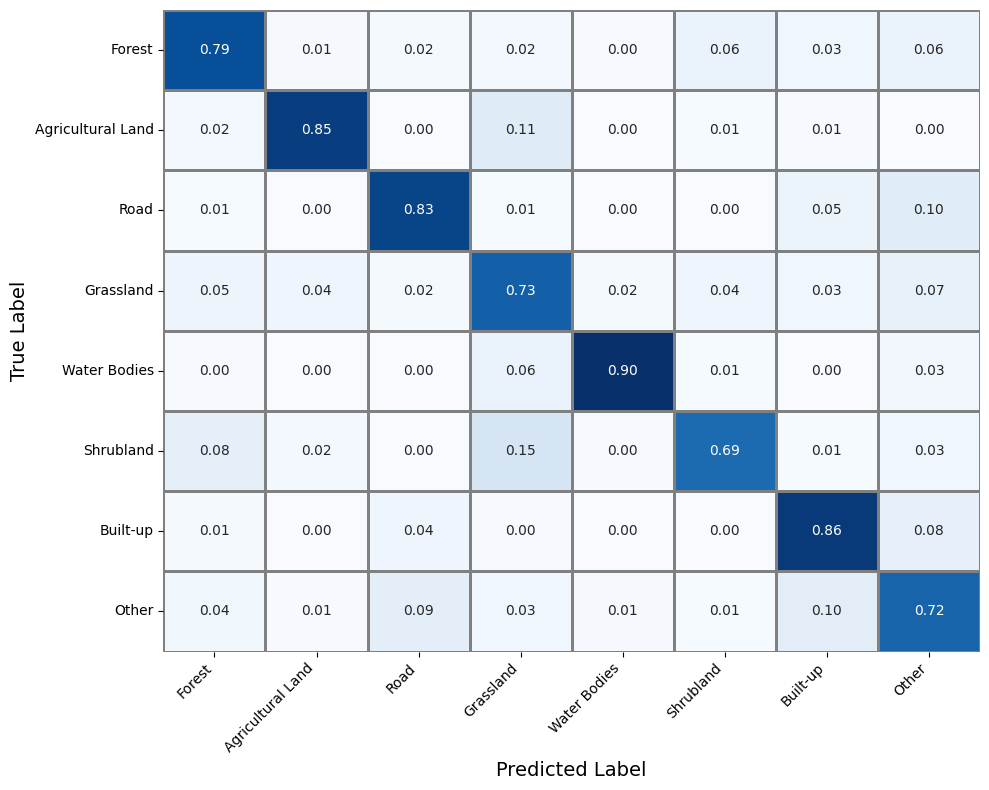

In [14]:
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix

total_steps = len(test_generator)  
# Initialize arrays to store predictions and true labels
all_preds = []
all_true = []

# Loop through the test generator to collect predictions and ground truths
for i in range(total_steps):
    # Get the next batch of images and masks from the generator
    batch = test_generator[i]
    imgs, masks = batch[0], batch[1]  # Assuming the generator returns (images, masks)

    preds = model.predict(imgs)  # Predict on the batch
    preds = preds.argmax(axis=-1)  # Convert probabilities to class indices
    masks = masks.argmax(axis=-1)  # Convert one-hot masks to class indices

    all_preds.append(preds)
    all_true.append(masks)

# Convert the lists to numpy arrays and flatten them
y_true_flat = np.concatenate(all_true, axis=None)  # Concatenate and flatten true labels
y_pred_flat = np.concatenate(all_preds, axis=None)  # Concatenate and flatten predictions

# Class labels for the confusion matrix
class_labels = ['Forest', 'Agricultural Land', 'Road', 'Grassland',
                'Water Bodies', 'Shrubland', 'Built-up', 'Other']

# Confusion Matrix
conf_matrix = confusion_matrix(y_true_flat, y_pred_flat)
conf_matrix_normalized = conf_matrix.astype('float') / conf_matrix.sum(axis=1)[:, np.newaxis]
conf_matrix_normalized = np.nan_to_num(conf_matrix_normalized)  # Handle NaN values

# Plotting the confusion matrix
plt.figure(figsize=(10, 8))
ax = sns.heatmap(conf_matrix_normalized, annot=True, cmap='Blues',
                 xticklabels=class_labels, yticklabels=class_labels, fmt='.2f', cbar=False,  # Set cbar=False to remove the color bar
                 linewidths=0.722819, linecolor='gray')

# Increase font size of text labels
plt.xlabel('Predicted Label', fontsize=14)
plt.ylabel('True Label', fontsize=14)

# Make all four borders bold and equal
for spine in ax.spines.values():
    spine.set_linewidth(2)  # Adjust thickness (e.g., 2 for bold)

# Rotate x-axis labels for better readability
plt.xticks(rotation=45, ha="right")

# Add title
plt.title('')

# Save the plot as a file with high quality (300 dpi)
plt.tight_layout()
plt.savefig('/home/rdadmin/Tsiyon/NEWONE/RESULT/UNETmob_CM1.png', dpi=300)# Show the plot# Show the plot
plt.show()

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 408ms/step


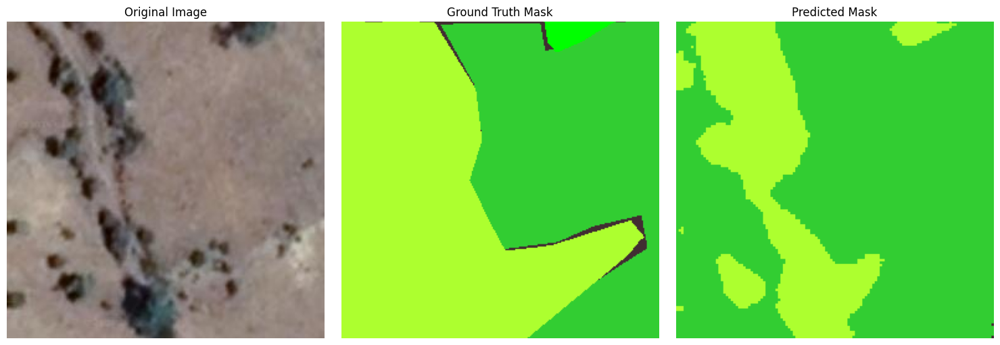

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 343ms/step


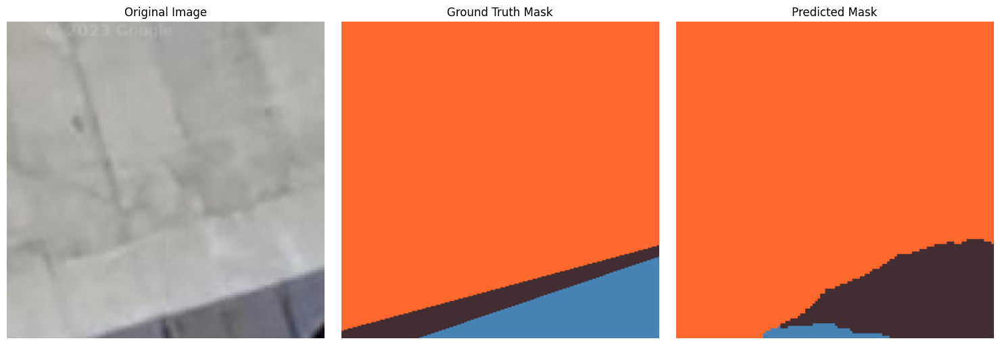

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 334ms/step


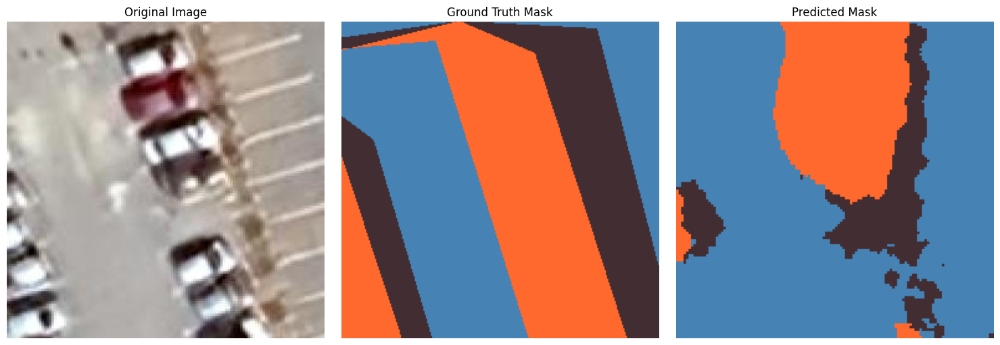

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 327ms/step


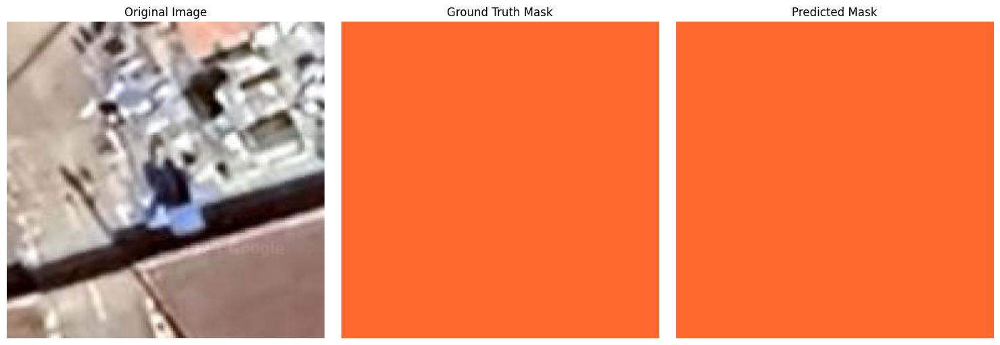

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 334ms/step


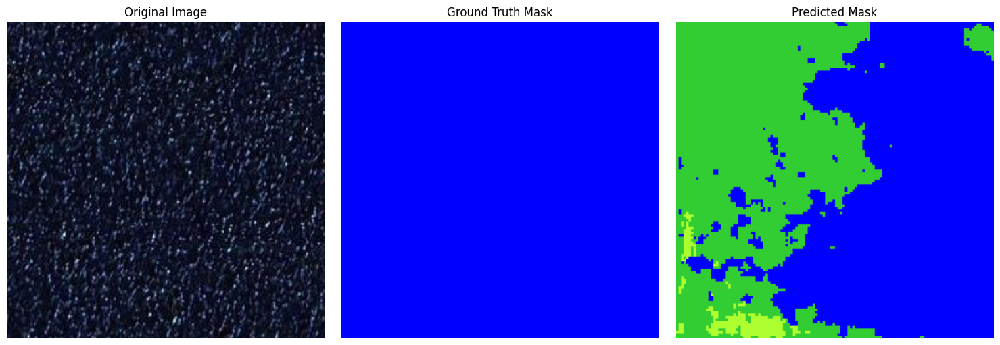

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 373ms/step


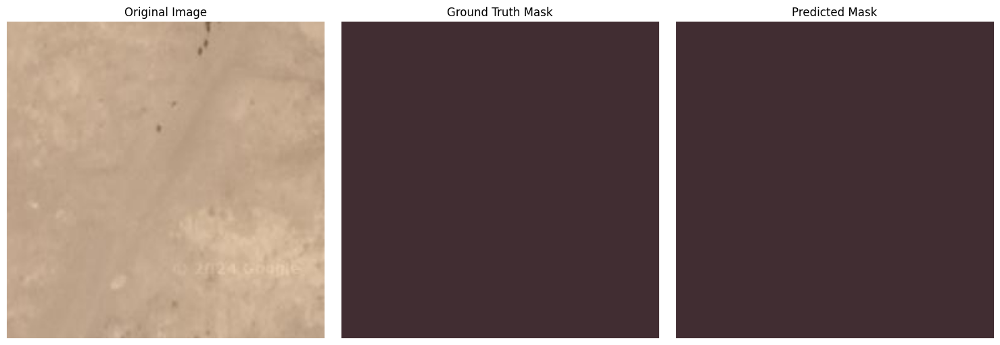

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 358ms/step


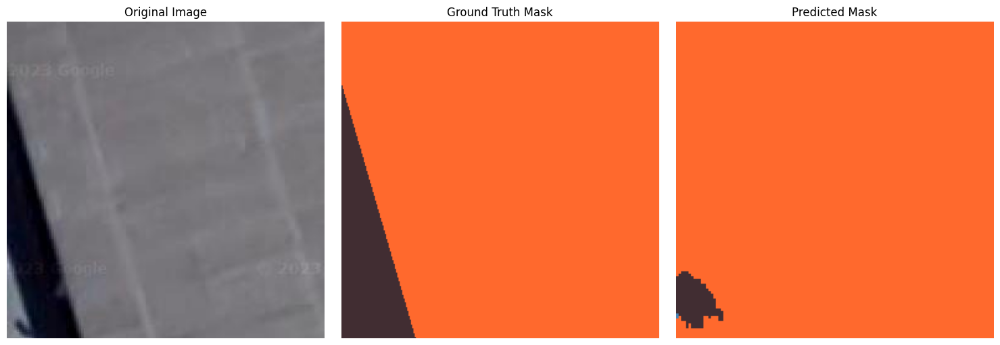

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 357ms/step


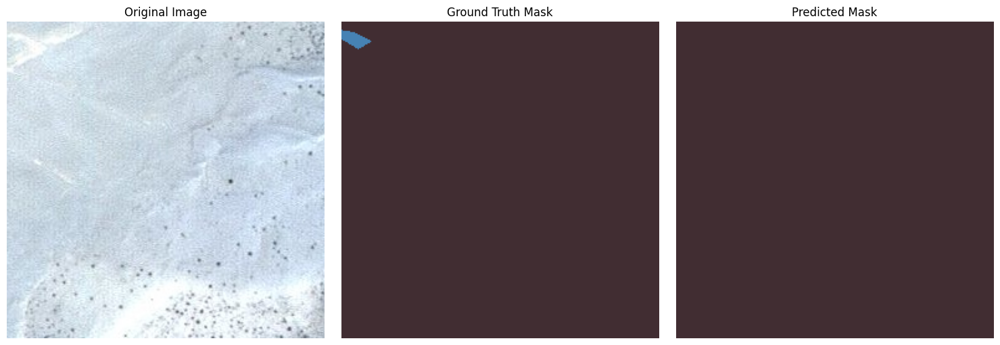

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 355ms/step


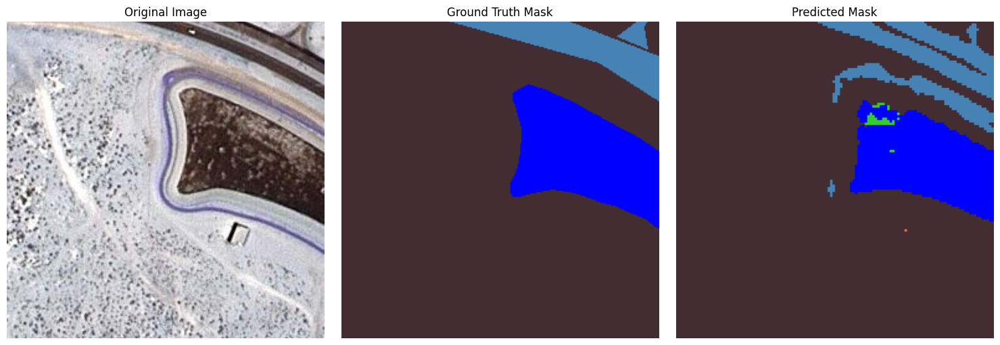

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 342ms/step


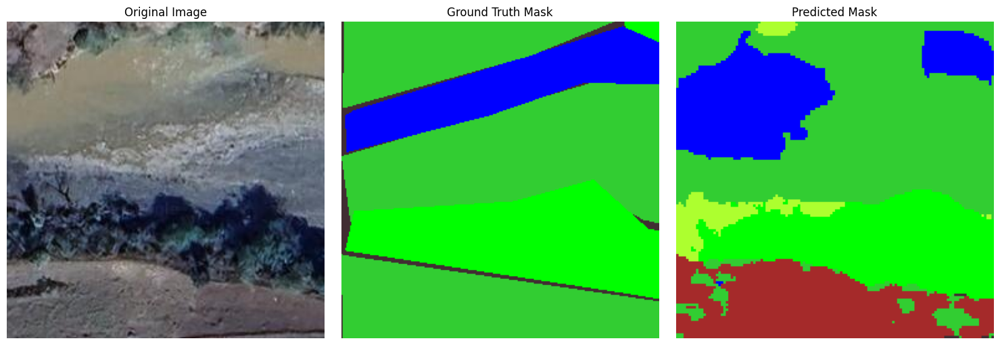

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 335ms/step


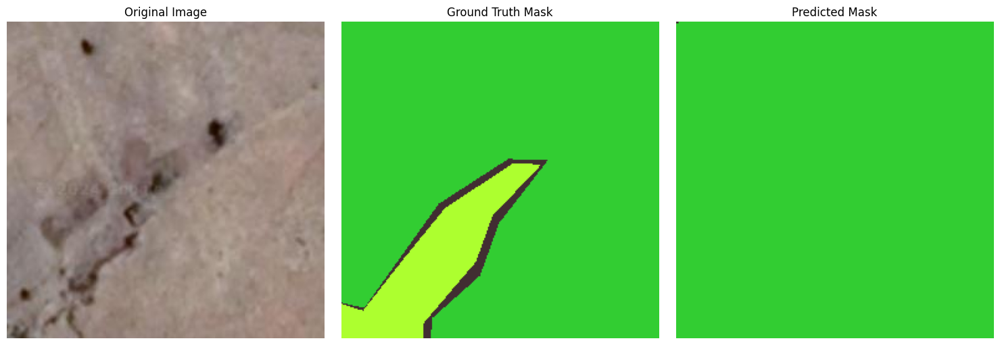

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 381ms/step


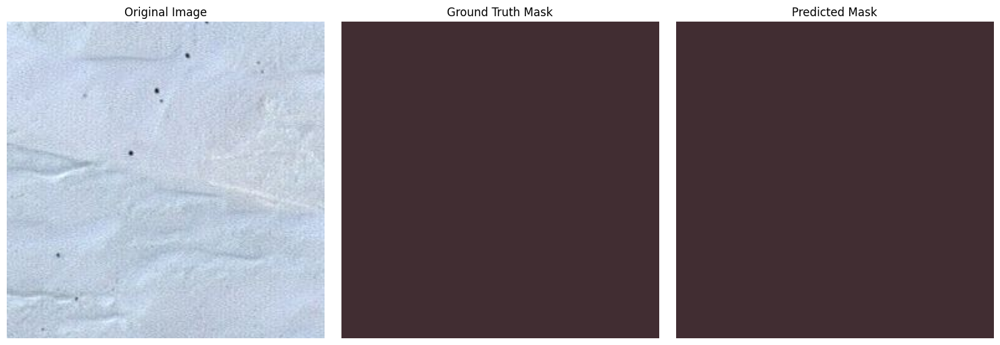

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 384ms/step


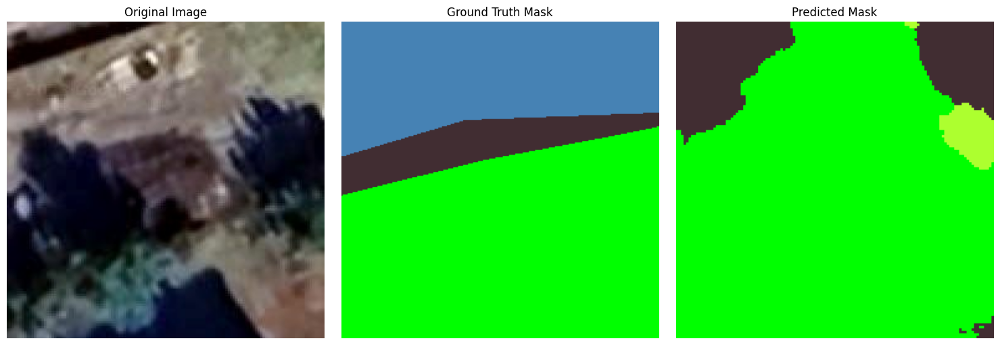

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 388ms/step


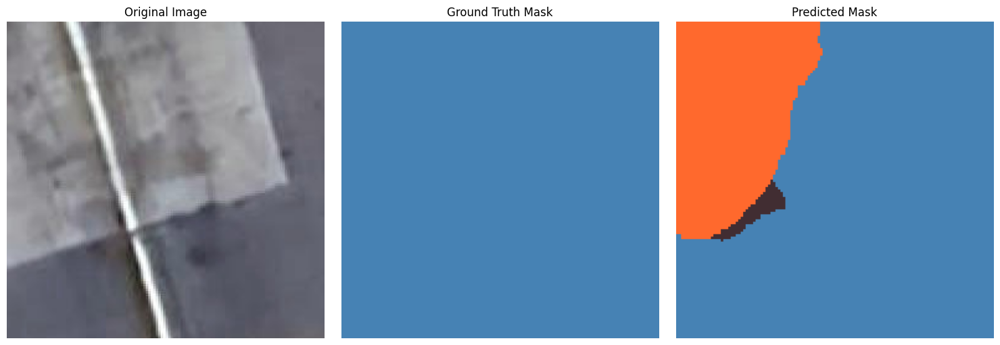

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 394ms/step


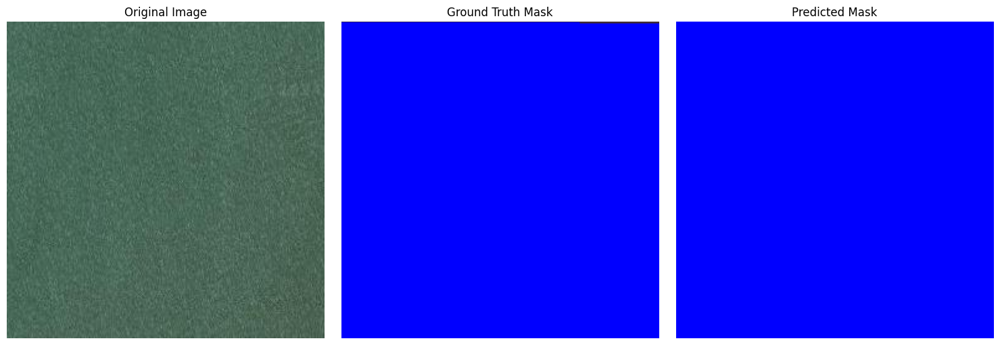

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 337ms/step


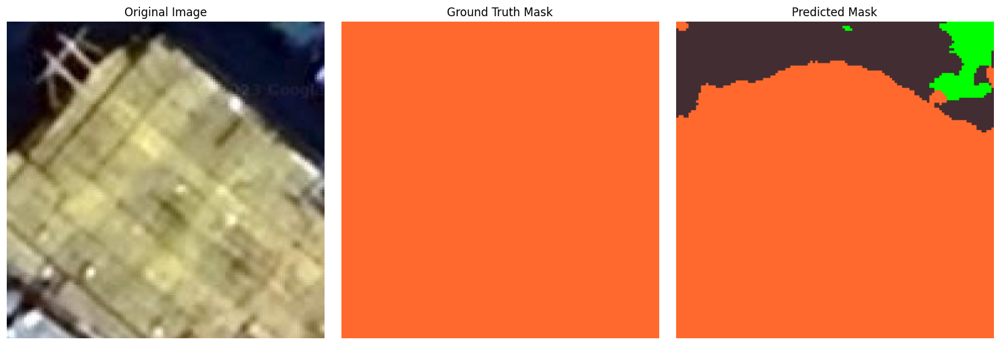

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 336ms/step


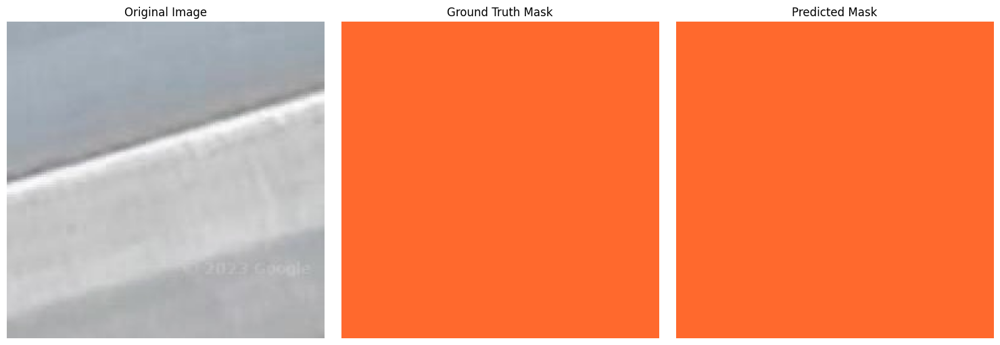

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 341ms/step


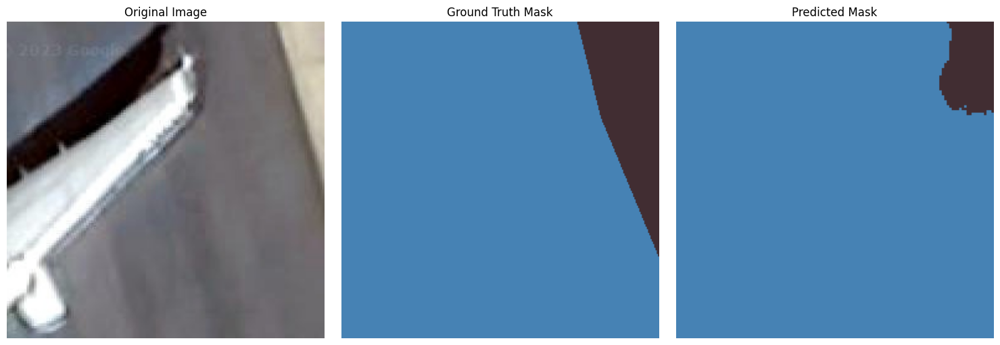

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 334ms/step


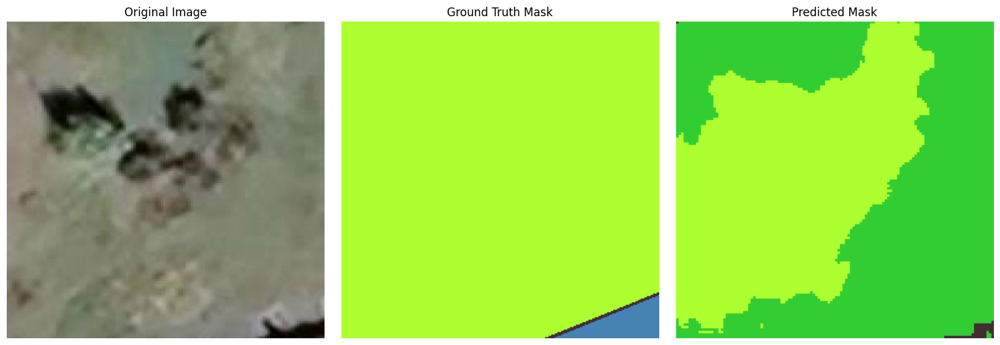

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 338ms/step


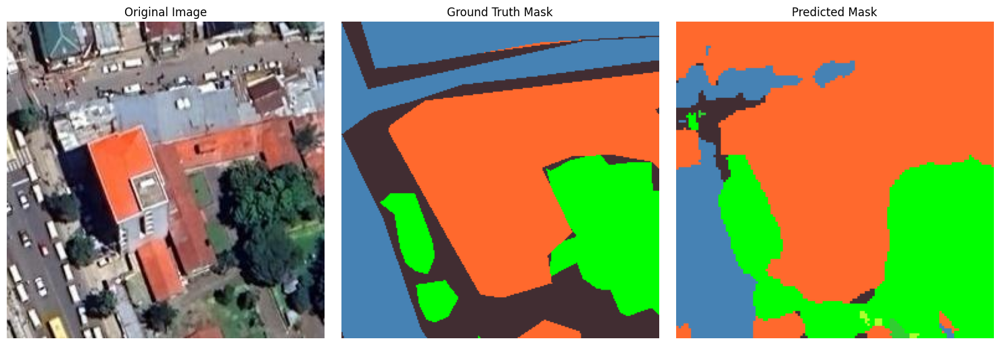

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 369ms/step


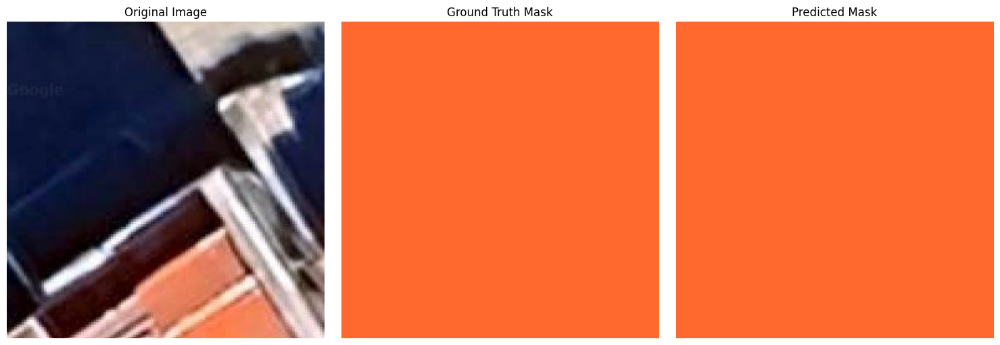

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 366ms/step


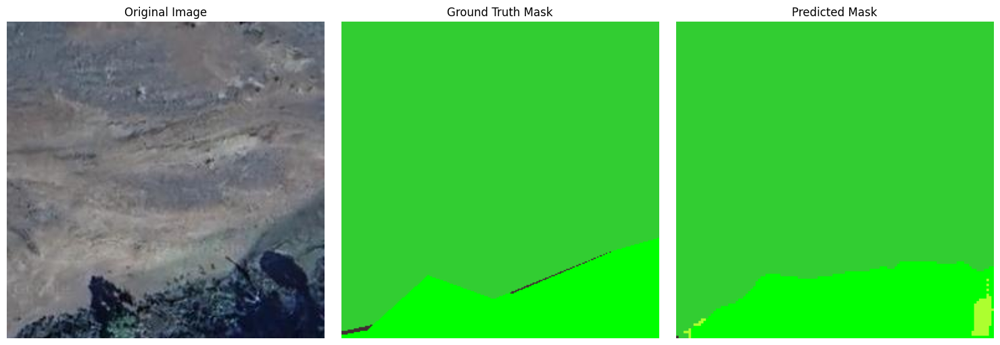

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 355ms/step


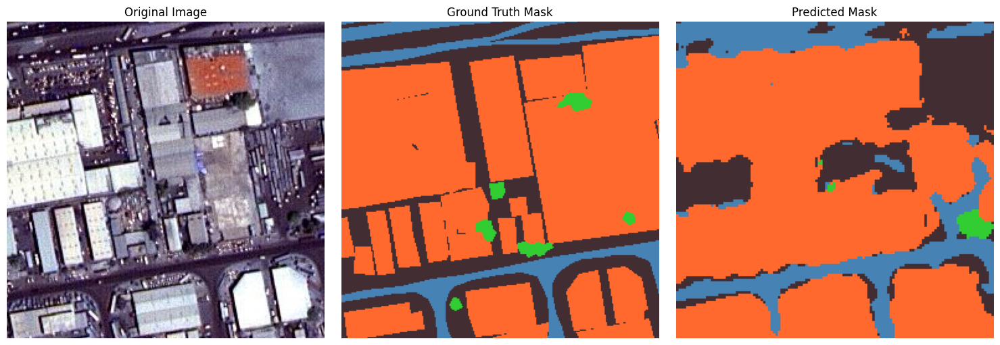

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 405ms/step


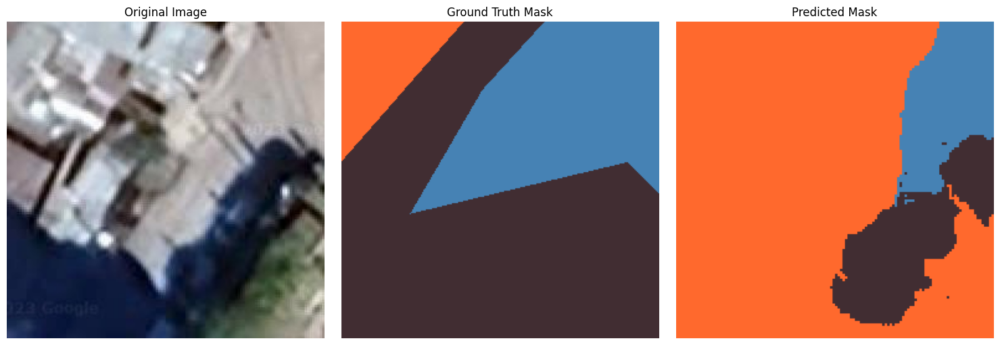

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 402ms/step


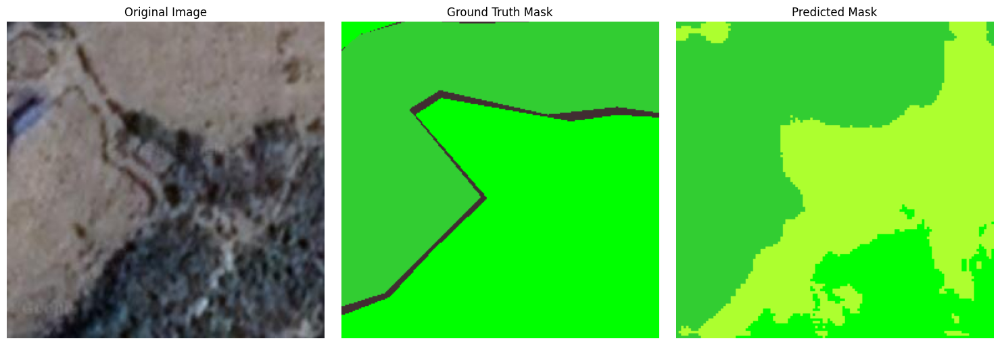

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 398ms/step


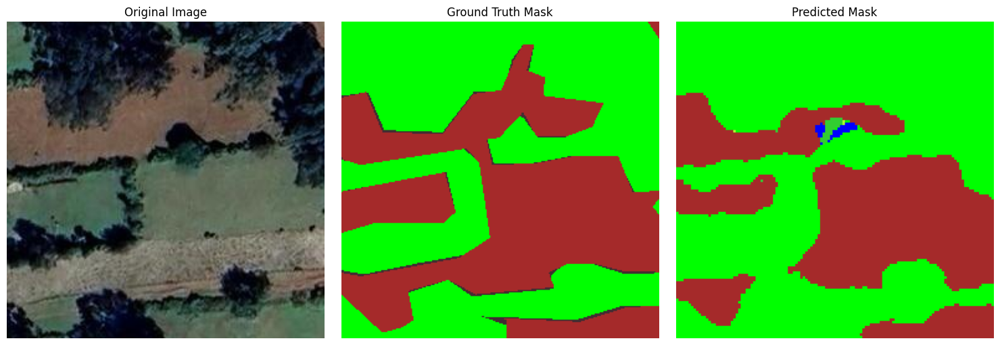

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 406ms/step


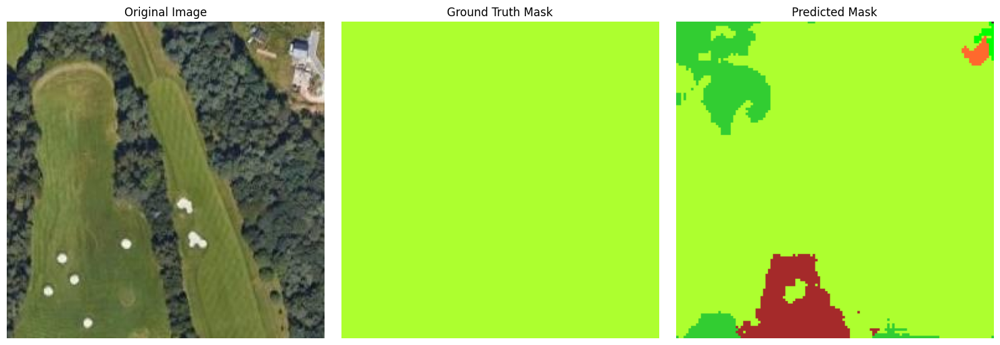

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 383ms/step


2025-02-28 11:52:33.725378: I tensorflow/core/framework/local_rendezvous.cc:405] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node MultiDeviceIteratorGetNextFromShard}}]]
	 [[RemoteCall]]


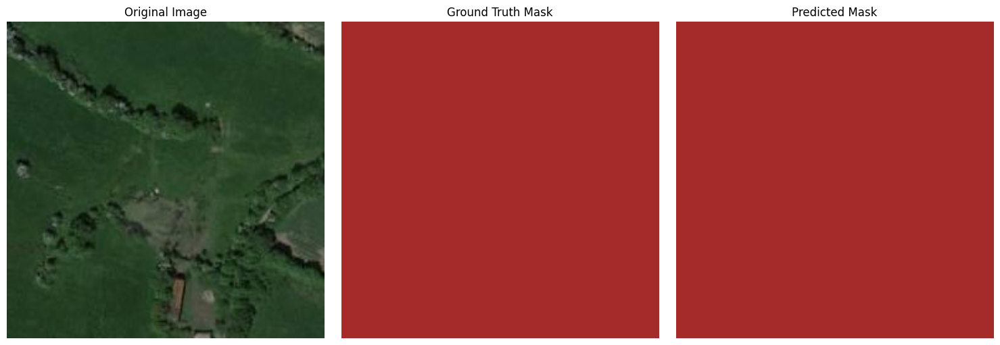

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 385ms/step


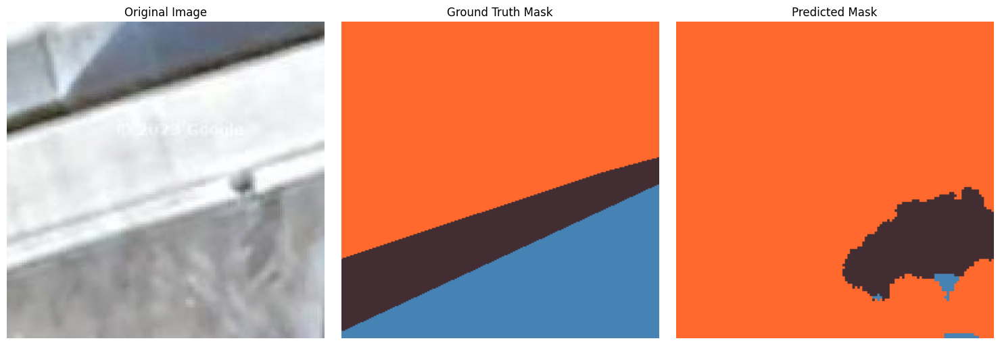

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 350ms/step


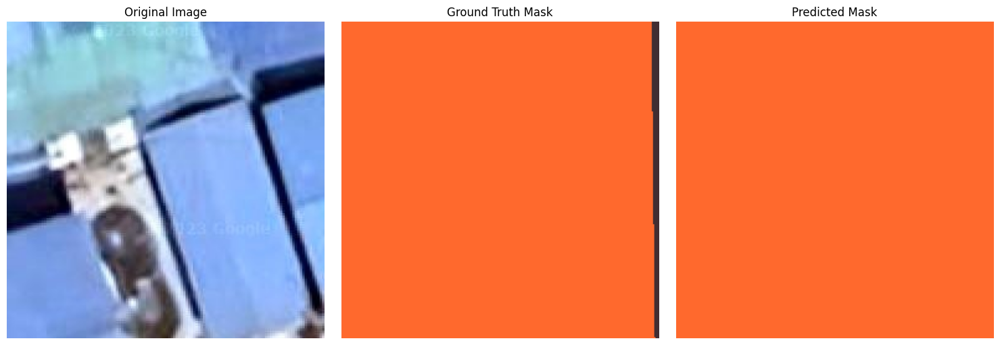

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 405ms/step


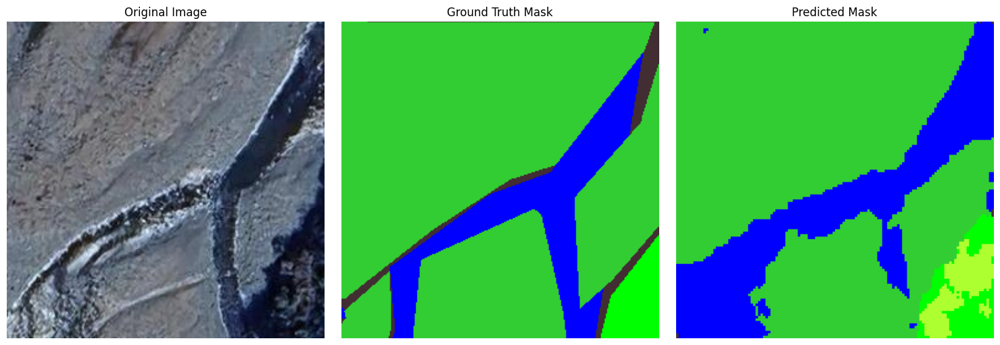

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 350ms/step


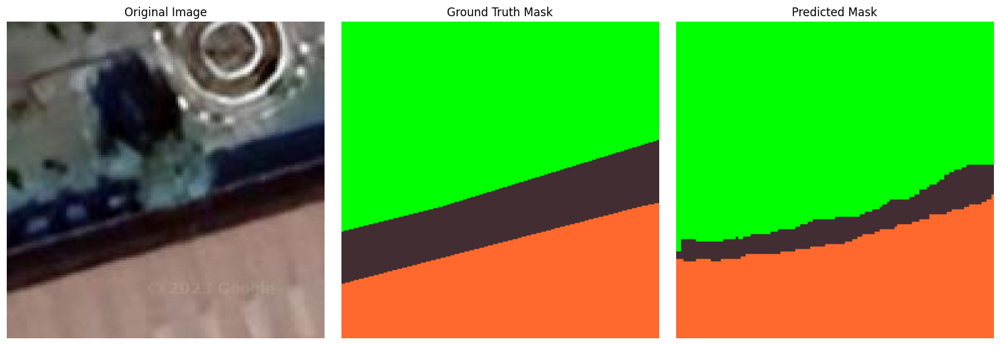

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 347ms/step


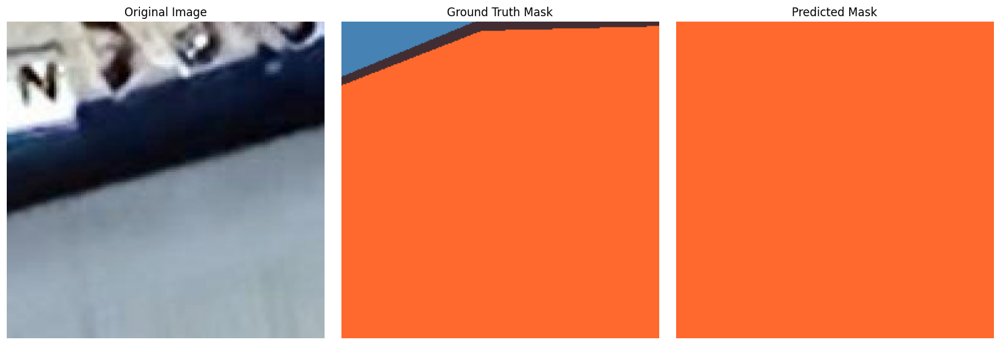

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 390ms/step


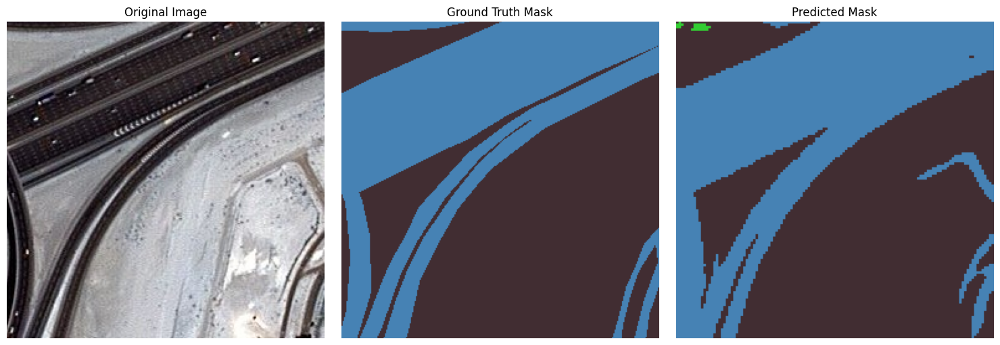

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 386ms/step


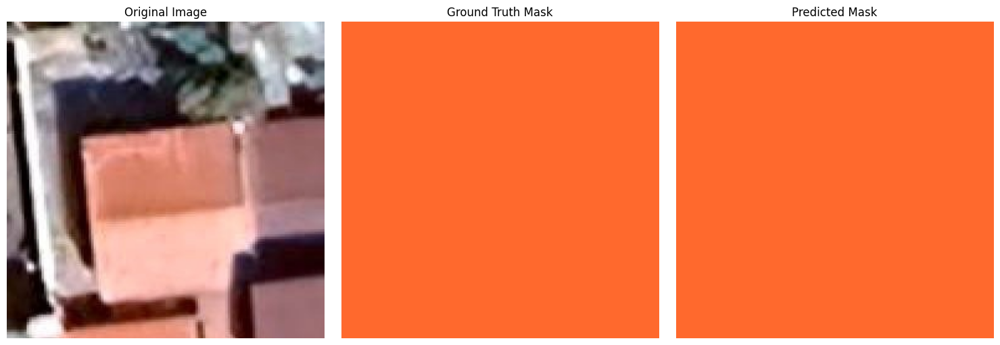

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


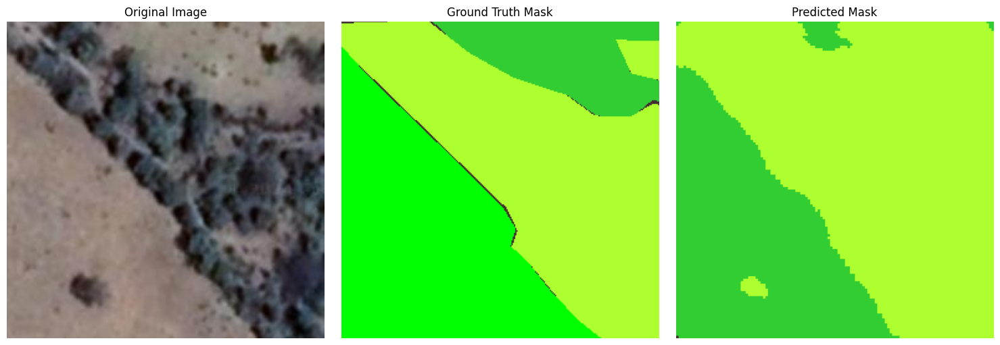

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 407ms/step


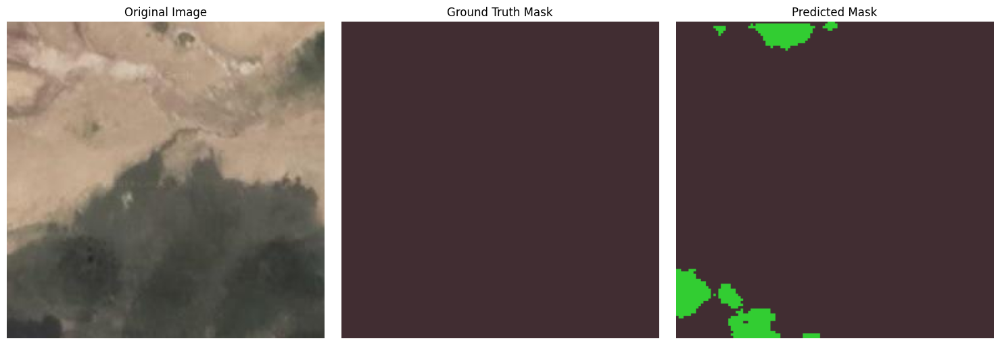

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 425ms/step


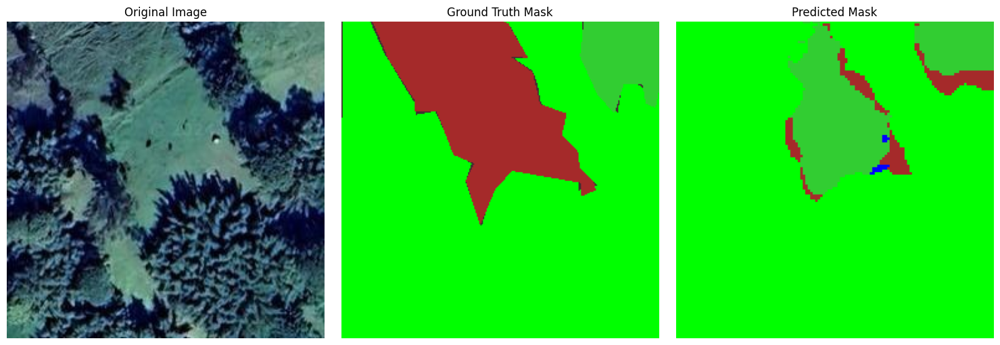

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 411ms/step


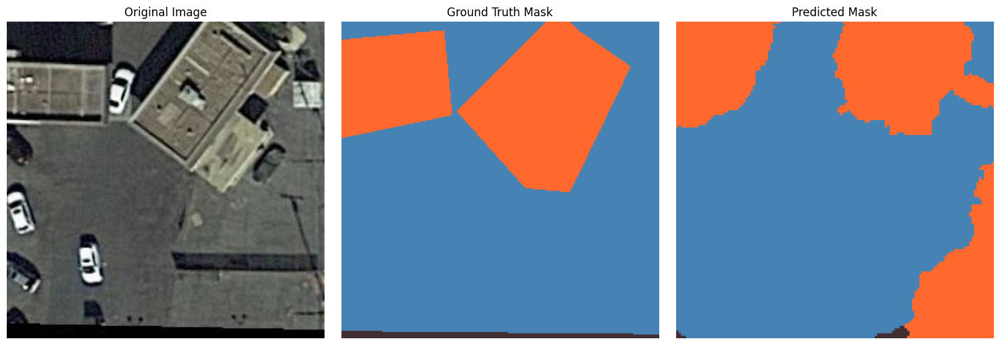

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 430ms/step


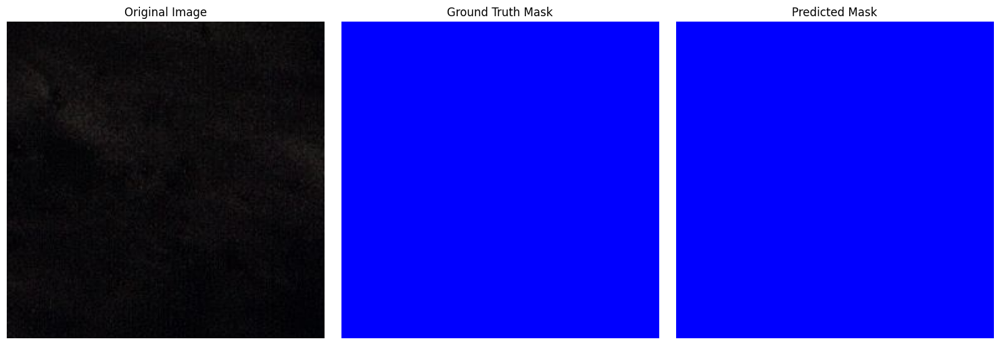

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 381ms/step


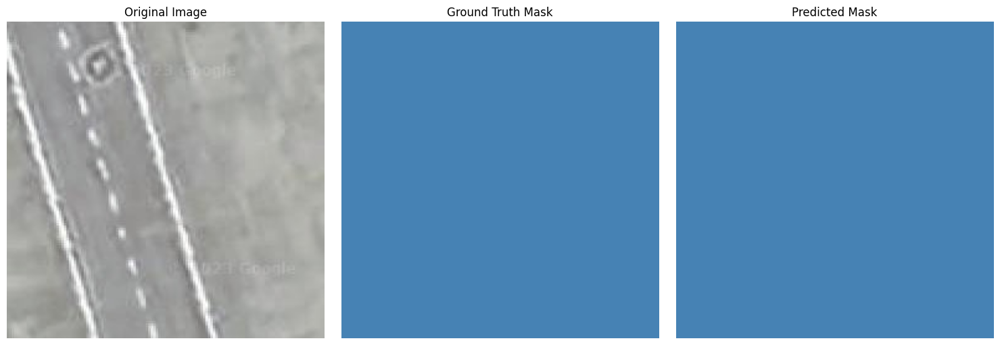

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 398ms/step


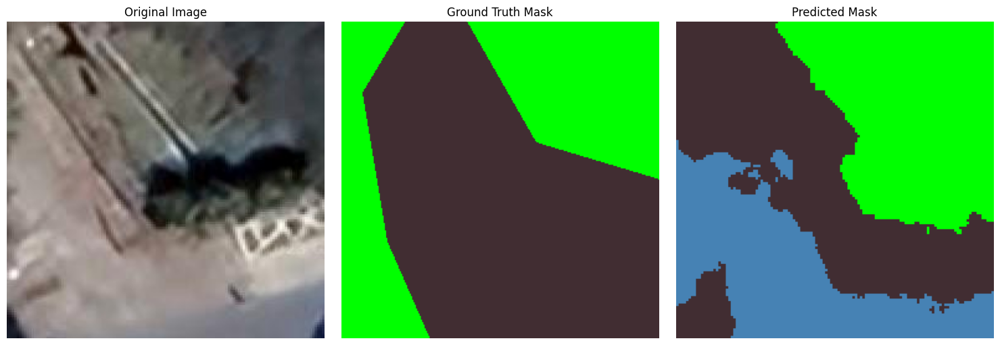

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 356ms/step


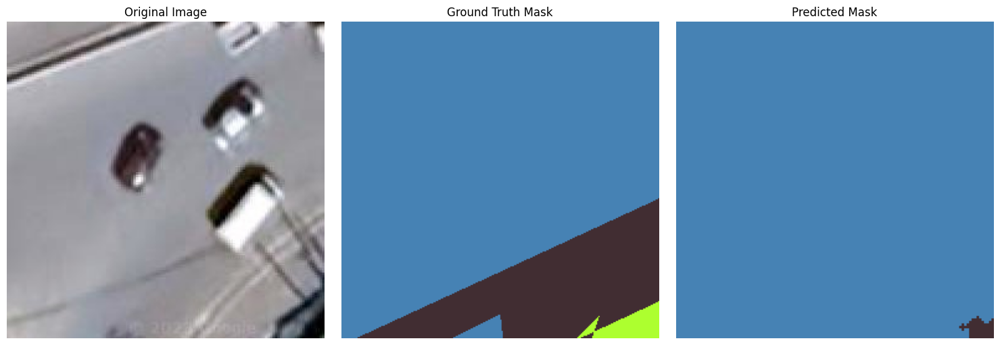

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 349ms/step


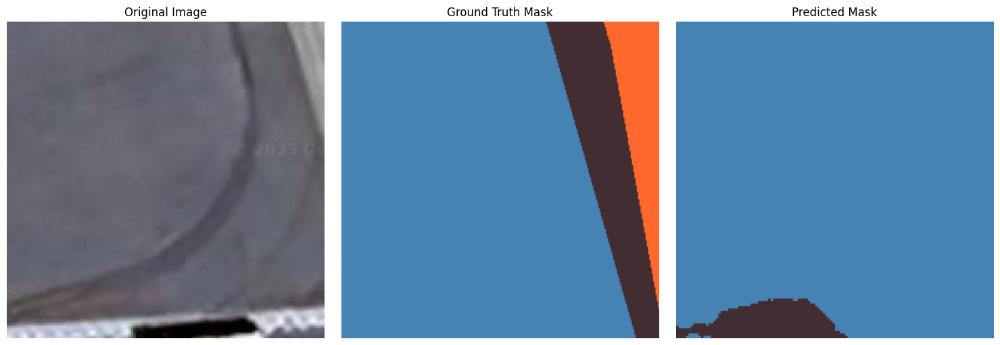

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 356ms/step


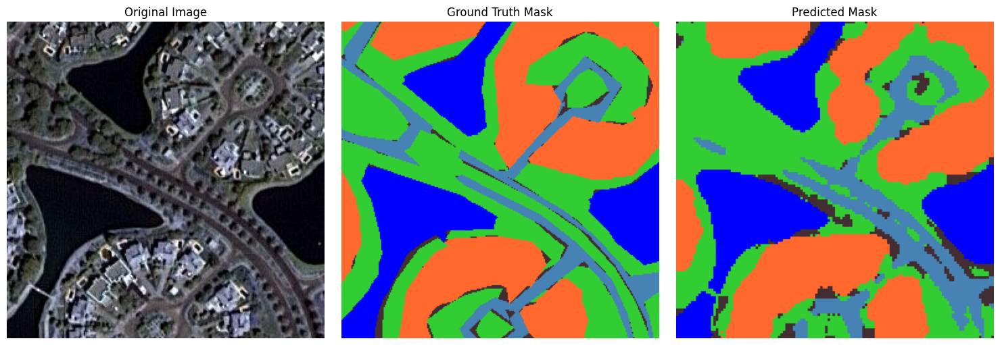

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 359ms/step


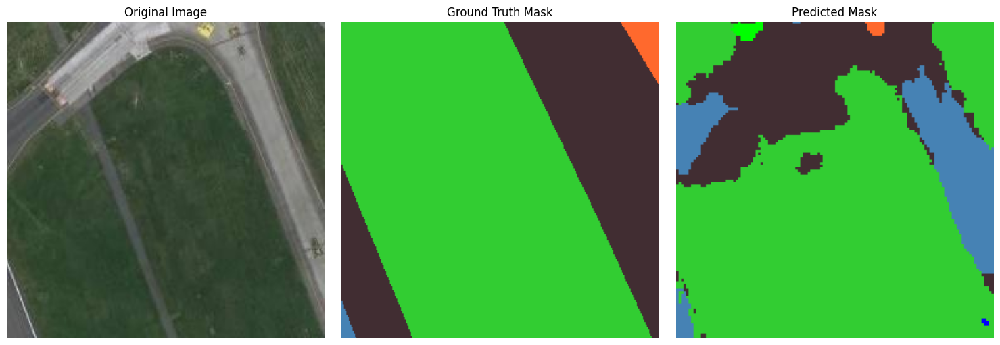

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 370ms/step


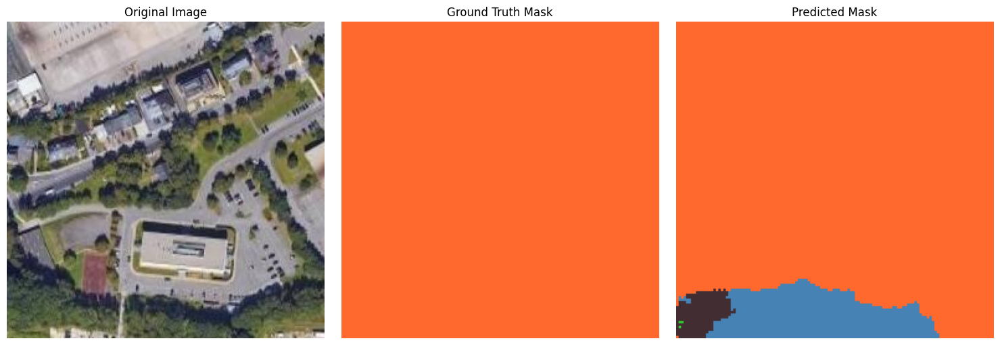

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 353ms/step


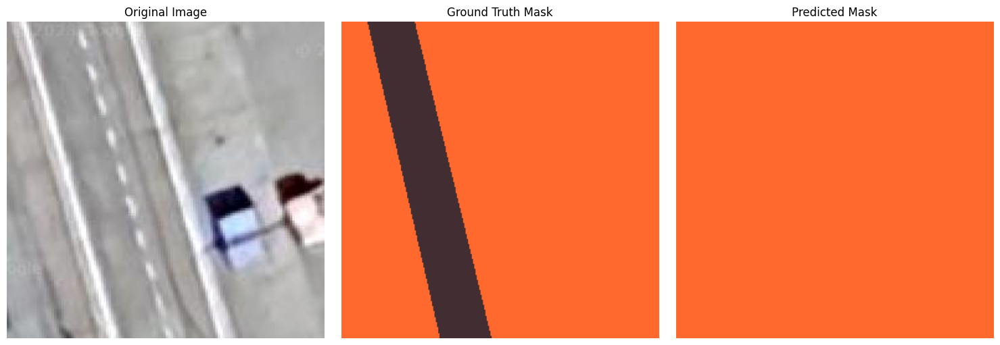

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 343ms/step


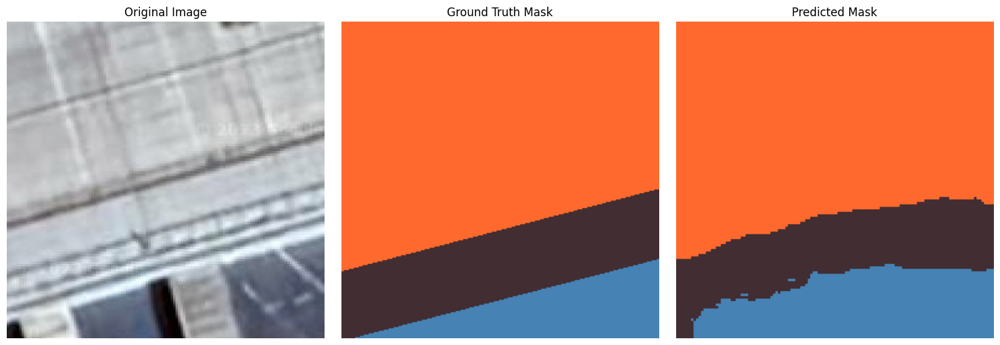

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 388ms/step


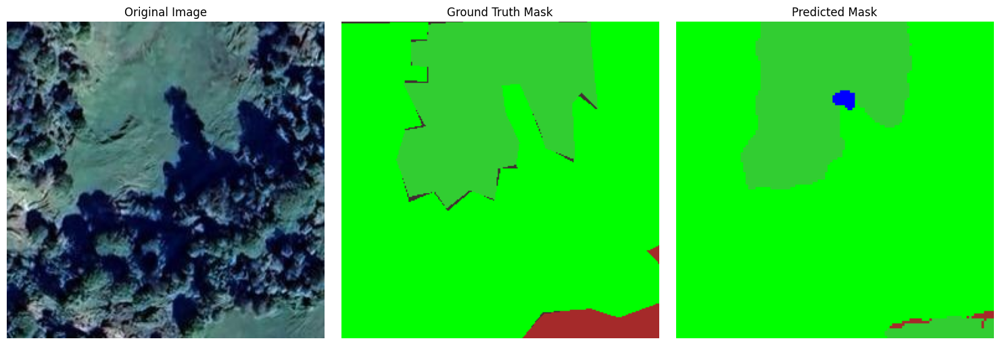

: 

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Color map for visualization
color_map = {
    0: [0, 255, 0],      # Class 0
    1: [165, 42, 42],    # Class 1
    2: [70, 130, 180],   # Class 2
    3: [50, 205, 50],    # Class 3
    4: [0, 0, 255],      # Class 4
    5: [173, 255, 47],   # Class 5
    6: [255, 105, 45],   # Class 6
    7: [65, 45, 50]      # Class 7
}

# Function to apply the color map to predictions
def colorize_predictions(mask, color_map):
    colorized_image = np.zeros((*mask.shape, 3), dtype=np.uint8)
    for cls, color in color_map.items():
        colorized_image[mask == cls] = color
    return colorized_image

# Loop through indices 900 to 300
for specific_image_index in range(750, 800):
    batch_index = specific_image_index // test_generator.batch_size  # Batch number
    image_index = specific_image_index % test_generator.batch_size   # Index within the batch

    # Retrieve the specific batch
    images, ground_truth_masks = test_generator[batch_index]

    # Select the specific image and ground truth mask
    original_image = images[image_index]
    ground_truth_mask = ground_truth_masks[image_index]
    ground_truth_mask = np.argmax(ground_truth_mask, axis=-1)  # Decode the ground truth mask

    # Predict the mask for the specific image
    predicted_mask = model.predict(np.expand_dims(original_image, axis=0))
    predicted_mask = np.argmax(predicted_mask[0], axis=-1)  # Decode prediction

    # Apply color mapping
    colorized_ground_truth = colorize_predictions(ground_truth_mask, color_map)
    colorized_predicted_mask = colorize_predictions(predicted_mask, color_map)

    # Scale original image if normalized
    if original_image.max() <= 1.0:
        original_image = (original_image * 255).astype('uint8')

    # Plot visualization
    plt.figure(figsize=(15, 5))

    # Original image
    plt.subplot(1, 3, 1)
    plt.imshow(original_image)
    plt.title("Original Image")
    plt.axis("off")

    # Ground truth mask
    plt.subplot(1, 3, 2)
    plt.imshow(colorized_ground_truth)
    plt.title("Ground Truth Mask")
    plt.axis("off")

    # Predicted mask
    plt.subplot(1, 3, 3)
    plt.imshow(colorized_predicted_mask)
    plt.title("Predicted Mask")
    plt.axis("off")

    plt.tight_layout()
    plt.show()